<a href="https://colab.research.google.com/github/martaherraiz/ProcesamientoMultimedia/blob/main/TrackingCoches.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install opencv-python
!pip install opencv_jupyter_ui
!pip install -q ipycanvas==0.11
from google.colab import output
output.enable_custom_widget_manager()
import cv2
from google.colab.patches import cv2_imshow
import opencv_jupyter_ui as jcv2
from google.colab.patches import cv2_imshow

Implementa un tracker de objetos utilizando la distancia euclidiana para seguir el movimiento de objetos en una secuencia de imágenes. El propósito de este código es asignar un identificador único a cada objeto (en un video de coches en la carretera en este caso) y hacer un seguimiento de su posición en el tiempo.

Primero se guardan las posiciones de los objetos que se encuentran y luego con el for se compara el centro de este nuevo objeto con los centros de los objetos ya rastreados (almacenados en self.center_points).
Se calcula la distancia euclidiana entre el centro del objeto actual y los ya guardados con math.hypot(). Esta es una fórmula para calcular la distancia entre dos puntos en un plano. Si la distancia es menor que un umbral (25 en este caso), asumimos que es el mismo objeto y actualizamos su posición en el diccionario, Si el objeto no ha sido detectado antes (la distancia es mayor que 25), le asignamos un nuevo ID y lo añadimos al diccionario center_points.

In [2]:
import math

class EuclideanDistTracker:
    def __init__(self):
        self.center_points = {}  # Almacena las posiciones de los objetos con su ID
        self.id_count = 0  # Contador para asignar nuevos IDs a los objetos detectados

    def update(self, objects_rect):
        objects_bbs_ids = []  # Lista para almacenar los objetos con sus bounding boxes y IDs

        # Para cada rectángulo detectado en la imagen
        for rect in objects_rect:
            x, y, w, h = rect
            cx = (x + x + w) // 2  # Coordenada X del centro del objeto
            cy = (y + y + h) // 2  # Coordenada Y del centro del objeto
            same_object_detected = False

            # Comparar el centro del objeto con los centros de los objetos ya rastreados
            for id, pt in self.center_points.items():
                dist = math.hypot(cx - pt[0], cy - pt[1])  # Distancia euclidiana entre los puntos
                if dist < 25:  # Si la distancia es menor que un umbral (25 en este caso)
                    self.center_points[id] = (cx, cy)  # Actualizar el centro del objeto rastreado
                    objects_bbs_ids.append([x, y, w, h, id])  # Añadir el objeto con su ID
                    same_object_detected = True
                    break

            # Si no se ha detectado el mismo objeto, asignar un nuevo ID
            if not same_object_detected:
                self.center_points[self.id_count] = (cx, cy)  # Añadir nuevo objeto con nuevo ID
                objects_bbs_ids.append([x, y, w, h, self.id_count])  # Añadir el objeto con su nuevo ID
                self.id_count += 1  # Incrementar el contador de IDs

        # Actualizar los centros de los objetos
        new_center_points = {}
        for obj_bb_id in objects_bbs_ids:
            _, _, _, _, object_id = obj_bb_id
            center = self.center_points[object_id]  # Obtener la posición del centro de cada objeto
            new_center_points[object_id] = center  # Asignar la posición actualizada al objeto
        self.center_points = new_center_points.copy()  # Actualizar el diccionario de centros

        return objects_bbs_ids  # Retornar los objetos con sus bounding boxes y IDs

backeraser = cv2.createBackgroundSubtractorMOG2() es una línea donde utiliza el algoritmo MOG2 (Mixture of Gaussians) para detectar objetos en movimiento. Este algoritmo aprende el fondo de la escena y permite identificar los objetos que se mueven, diferenciándolos del fondo estático. El fondo es “eliminado” (substraído) para resaltar solo los objetos en movimiento.

In [3]:
tracker = EuclideanDistTracker()
# Tamaños mínimos que detectará
min_width = 10
min_height = 10

cap = cv2.VideoCapture("traffic.mp4")

# Check if camera opened successfully
if (cap.isOpened()== False):
    print("Error opening video file")

# Create tracker object
tracker = EuclideanDistTracker()
backeraser = cv2.createBackgroundSubtractorMOG2()

El algoritmo implementa un sistema de rastreo de objetos en un video usando un enfoque basado en la distancia euclidiana para identificar y seguir objetos en movimiento. Primero, extrae los contornos de los objetos detectados en cada fotograma mediante un sustractor de fondo y umbralización. Luego, calcula el centro de cada objeto y verifica si ya existe un objeto previamente rastreado en esa ubicación, basándose en la distancia entre los centros actuales y anteriores. Si se encuentra una coincidencia, se asigna la misma ID al objeto; de lo contrario, se asigna una nueva ID. Los objetos rastreados se etiquetan con su ID y se dibujan rectángulos alrededor de ellos. El proceso se repite fotograma a fotograma, hasta que se alcanza el número máximo de fotogramas o se finaliza el video.

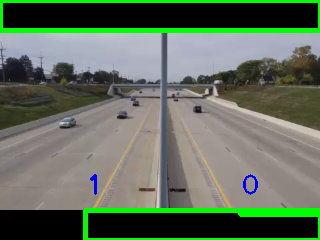

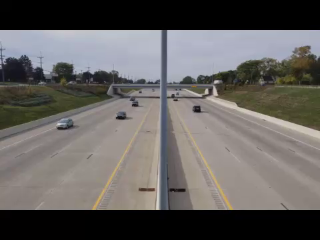

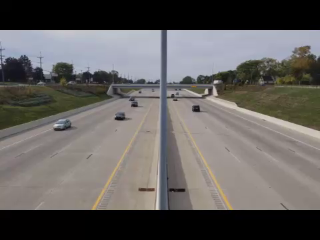

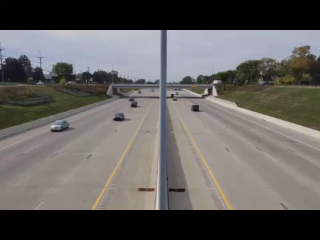

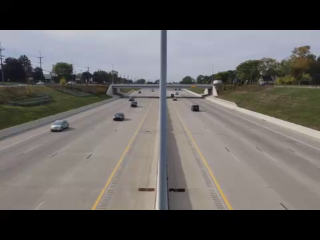

...

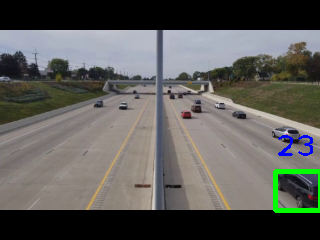

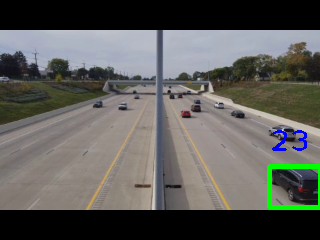

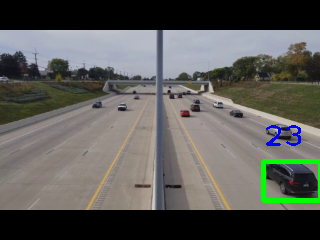

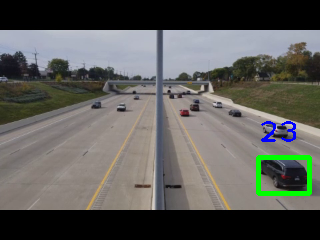

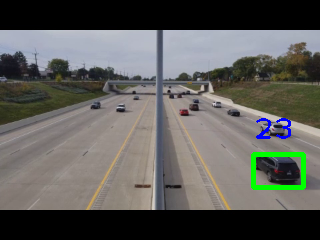

KeyboardInterrupt: 

In [4]:
# Leer fotograma por fotograma
while cap.isOpened():
    ret, frame = cap.read()

    if ret:
        # Redimensionar el fotograma (opcional)
        frame = cv2.resize(frame, (320, 240))

        # Aplicar el subtractor de fondo
        mask = backeraser.apply(frame)

        # Umbralizar la máscara para obtener solo objetos en movimiento
        _, mask = cv2.threshold(mask, 254, 255, cv2.THRESH_BINARY)

        # Encontrar contornos en la imagen umbralizada
        contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        detections = []
        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area > 100:  # Filtrar elementos pequeños
                # Obtener el rectángulo que rodea el contorno
                x, y, w, h = cv2.boundingRect(cnt)
                detections.append([x, y, w, h])  # Guardar la detección

        # Rastrear los objetos con el tracker
        boxes_ids = tracker.update(detections)

        # Dibujar los resultados
        for box_id in boxes_ids:
            x, y, w, h, id = box_id
            # Escribir el ID del objeto
            cv2.putText(frame, str(id), (x, y - 15), cv2.FONT_HERSHEY_PLAIN, 2, (255, 0, 0), 2)
            # Dibujar el rectángulo alrededor del objeto
            cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 3)

        # Mostrar el fotograma con las detecciones y el rastreo
        cv2_imshow(frame)

        # Si se presiona la tecla 'q', salir del bucle
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break
    else:
        break

# Cuando todo haya terminado, liberar el objeto de captura de video
cap.release()

# Cerrar todas las ventanas abiertas de OpenCV
cv2.destroyAllWindows()